In [1]:
import pandas as pd
import numpy as np
import os
import datetime
from scipy import stats
import missingno as msno

from tqdm import tqdm

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
import seaborn as sns

import shapefile as shp

from sklearn.linear_model import LassoLars, Ridge, RidgeCV, LassoLarsCV, ElasticNetCV, ElasticNet
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score, cross_val_predict, RandomizedSearchCV, cross_validate
from sklearn.metrics import accuracy_score, r2_score
from sklearn import cluster, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

import geopandas as gpd

from mpl_toolkits.axes_grid1 import make_axes_locatable

from bokeh.plotting import figure
from bokeh.io import show, output_notebook, output_file
from bokeh.models import CategoricalColorMapper, HoverTool, ColumnDataSource, Panel
from bokeh.palettes import d3
from bokeh.models.widgets import CheckboxGroup, Slider, RangeSlider, Tabs
from bokeh.layouts import column, row, WidgetBox
from bokeh.application.handlers import FunctionHandler
from bokeh.application import Application

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

from kerastuner.tuners import RandomSearch, Hyperband

import pickle
from joblib import dump, load

today = datetime.date.today().strftime("%y%m%d")

output_notebook()

Loading BokehJS ...

## Import the shape files for plotting Portuguese districts

In [2]:
shp_path = '/mnt/c/Users/henri/Documents/Shape_files/distritos_pt/distritos.shp'
sf = shp.Reader(shp_path)
gdf = gpd.read_file(shp_path)

gdf = gdf[gdf['TYPE_1'] == 'Distrito'].reset_index(drop=True)
gdf.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,HASC_1,CCN_1,CCA_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry
0,182,PRT,Portugal,1,Évora,PT.EV,0,07,Distrito,District,None,None,"POLYGON ((-8.14205 39.01529, -8.14165 39.01466..."
1,182,PRT,Portugal,2,Aveiro,PT.AV,0,01,Distrito,District,None,None,"MULTIPOLYGON (((-8.68208 40.69458, -8.68208 40..."
2,182,PRT,Portugal,4,Beja,PT.BE,0,02,Distrito,District,None,None,"MULTIPOLYGON (((-8.79264 37.71875, -8.79264 37..."
3,182,PRT,Portugal,5,Braga,PT.BR,0,03,Distrito,District,None,None,"POLYGON ((-8.04962 41.81636, -8.04908 41.81543..."
4,182,PRT,Portugal,6,Bragança,PT.BA,0,04,Distrito,District,None,Braganza,"POLYGON ((-6.79995 41.98915, -6.79787 41.98859..."


## Load main dataset

In [6]:
filepath = '../data/standvirtual_dataset_merge_200628.csv'
df = pd.read_csv(filepath)

#months = np.array(['january','february','march','april','may','june','july','august','september','october','november','december'])
#df['first_registration_month'] = [np.where(months == x)[0][0] if isinstance(x, str) else np.nan for x in df['first_registration_month']]
#df['advertiser'] = [1 if x == 'individial' else 0 if x == 'professional' else np.nan for x in df['advertiser']]
#df['traction'] = [0 if x == 'back' else 1 if x == 'front' else 2 if x == 'both' else np.nan for x in df['traction']]
#df['upholstery'] = [0 if x == 'fabric' else 1 if x == 'leather' else np.nan for x in df['upholstery']]
#df['air_conditioning'] = [0 if x == 'independent' else 1 if x == 'manual' else 2 if x == 'automatic' else np.nan for x in df['air_conditioning']]
#df['vehicle_condition'] = [0 if x == 'used' else 1 if x == 'new' else np.nan for x in df['vehicle_condition']]
#df['gear_type'] = [0 if x == 'manual' else 1 if x == 'semiauto' else 2 if x == 'automatic' else np.nan for x in df['gear_type']]

df = df.drop(columns=['title','link'])

df.head()

,accepts_recovery,advertiser,air_conditioning,airbags_n,alloy_wheels,alloy_wheels_size,brand,canopy,capacity,car_class,...,stand_guaranty_in_price,stand_guaranty_not_in_price,traction,two_key,upholstery,vat_deductable,vat_discriminated,vehicle_condition,version,vin
0,1.0,professional,manual,10.0,1.0,17.0,Mercedes-Benz,NaN,5.0,1.0,...,12.0,NaN,NaN,1.0,fabric,1.0,1.0,used,CDi BE Urban,WDD1760121J216069
1,NaN,individial,automatic,NaN,NaN,NaN,Peugeot,NaN,5.0,1.0,...,NaN,NaN,both,1.0,leather,NaN,NaN,used,2.0 HDi Hybrid4 Limited Edition 2-Tronic,NaN
2,NaN,individial,NaN,NaN,NaN,NaN,Porsche,NaN,5.0,1.0,...,NaN,NaN,both,1.0,NaN,NaN,NaN,used,TURBO (como NOVO),NaN
3,NaN,individial,NaN,NaN,NaN,NaN,Ford,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,used,Station 1.6 TDCi Titanium,NaN
4,NaN,individial,automatic,NaN,1.0,NaN,Mercedes-Benz,rigid,5.0,1.0,...,NaN,NaN,both,NaN,leather,NaN,NaN,used,d AMG Line 4-Matic,NaN


## Exploratory analysis

### Missing data

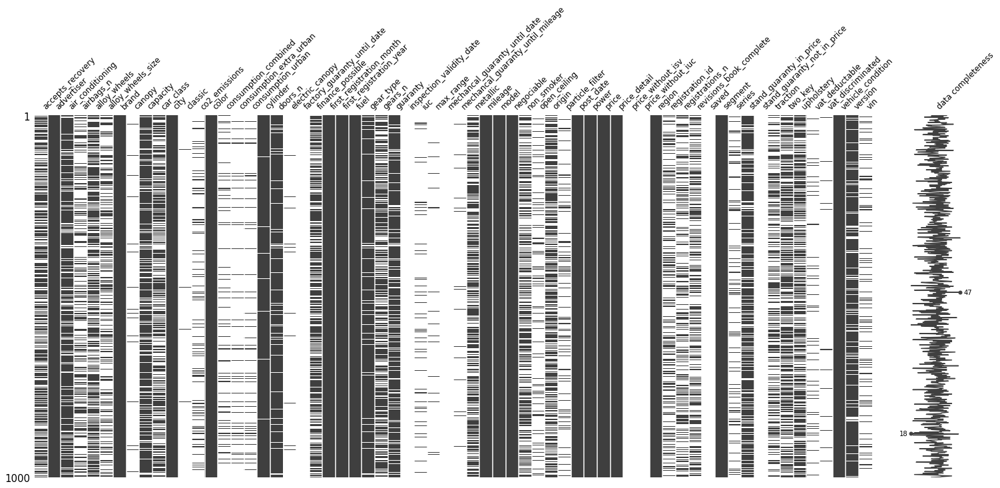

In [5]:
msno.matrix(df.sample(1000), labels=True, fontsize=12);

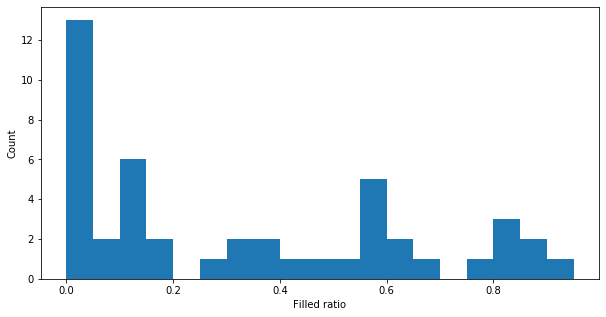

In [6]:
fill_ratio = df.notna().sum(axis=0)/len(df)

fig, ax = plt.subplots(1, figsize=[10,5])
plt.hist(fill_ratio, bins=np.arange(0,1,0.05))
plt.xlabel('Filled ratio')
plt.ylabel('Count')
plt.show()

## Plot region price averages

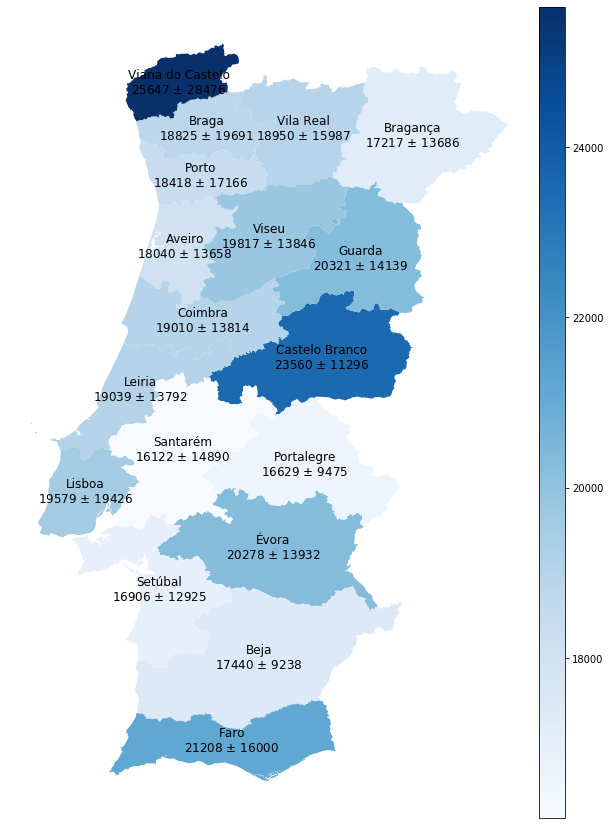

In [8]:
region_p_mean = gdf.merge(df.groupby('region').mean(), left_on = 'NAME_1', right_on = 'region')
region_p_sd = gdf.merge(df.groupby('region').std(), left_on = 'NAME_1', right_on = 'region')

regions = region_p_mean['NAME_1'].values

cx = region_p_mean.centroid.x.values
cy = region_p_mean.centroid.y.values

fig, ax = plt.subplots(figsize=[10,20])
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
region_p_mean.plot(column='price', ax=ax, legend=True, cmap='Blues', cax=cax)
for i in range(len(region_p_mean)):
    ax.text(cx[i],cy[i],
    '%s\n%d $\pm$ %d'%(regions[i],region_p_mean.at[i,'price'],region_p_sd.at[i,'price']),
    ha='center', va='center', fontsize=12)
ax.axis('off')
plt.show()

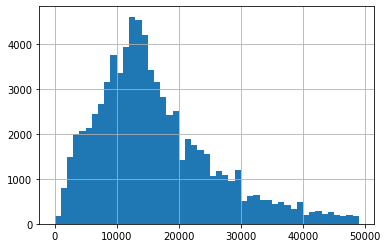

In [10]:
df['price'].hist(bins=np.arange(0,50000,1000))

In [9]:
df['price'].median()

14900.0

In [ ]:
cols2plot = [
    'mileage', 'power', 'price', 'cylinder',
    ]

g = sns.pairplot(df, corner=True, diag_kind='kde', x_vars=cols2plot, y_vars=cols2plot)
g.fig.set_size_inches(15,15)

## Correlation

In [ ]:
cols2use = ['mileage', 'power', 'first_registration_month', 'first_registration_year', 'negociable', 'price',
       'cylinder', 'gear_type', 'gears_n', 'doors_n', 'capacity', 'car_class', 'traction', 'co2_emissions', 
       'alloy_wheels_size', 'upholstery', 'airbags_n', 'air_conditioning', 'mechancal_guaranty_until_mileage', 
       'registrations_n', 'iuc', 'max_range']

corr = df[cols2use].corr()

g = sns.clustermap(corr, cmap="RdBu_r", vmin=-1, vmax=1, cbar_pos=(0.85, 0.05, 0.05, 0.15))

In [ ]:
brands_u, brands_c = np.unique(df['brand'].dropna(), return_counts=True)
brands_six = np.argsort(brands_c)[::-1]

fig, ax = plt.subplots(figsize=[10,20])
ax.barh(brands_u[brands_six], brands_c[brands_six])
ax.invert_yaxis()
ax.set_ylabel('Brand')
ax.set_xlabel('Count')
plt.show()


## Top models of top brands

In [ ]:
ntop_b = 9
ntop_m = 5

fig, ax = plt.subplots(3,3,figsize=[10,10], sharex='all')

row = 0
col = 0
for i, brand in enumerate(brands_u[brands_six[:ntop_b]]):
    models = df.loc[df['brand'] == brand, 'model'].dropna()
    models_u, models_c = np.unique(models, return_counts=True)
    six = np.argsort(models_c)[::-1]
    x = models_u[six[:ntop_m]]
    y = models_c[six[:ntop_m]]

    ax[row,col].barh(x,y)
    ax[row,col].invert_yaxis()
    ax[row,col].set_title(brand)

    if col == 2:
        row += 1
        col = 0
    else:
        col += 1

plt.tight_layout()


## Modelling

### Prepare data for modeling

In [3]:
def prepare_table(df, ffrac=np.nan, cols2use=[], norm=False, trainfrac=0.8):
    if ~np.isnan(ffrac):
        fill_ratio = df.notna().sum(axis=0)/len(df)
        cols2use = df.columns[fill_ratio >= ffrac]
    if 'price' not in cols2use:
        cols2use = np.append(cols2use,'price')
    df = df[cols2use]

    df = pd.get_dummies(df, prefix=df.columns[df.dtypes == 'object'], prefix_sep=':')    

    train_dataset = df.sample(frac=trainfrac)
    test_dataset = df.drop(train_dataset.index)

    train_labels = train_dataset.pop('price')
    test_labels = test_dataset.pop('price')

    # Remove NaN label rows
    nix_train = np.isnan(train_labels)
    nix_test = np.isnan(test_labels)
    train_dataset = train_dataset.loc[~nix_train]
    train_labels = train_labels.loc[~nix_train]
    test_dataset = test_dataset.loc[~nix_test]
    test_labels = test_labels.loc[~nix_test]

    train_mean = train_dataset.mean()
    train_std = train_dataset.std()

    nix = train_std == 0
    if any(nix):
        cnix = train_std.index[nix]
        train_dataset = train_dataset.drop(columns=cnix)
        test_dataset = test_dataset.drop(columns=cnix)
        train_mean = train_mean.drop(cnix)
        train_std = train_std.drop(cnix)    

    # Impute NaNs
    imputer = SimpleImputer(strategy="mean")
    imputer.fit(train_dataset)    

    train_dataset = pd.DataFrame(imputer.transform(train_dataset), columns=train_dataset.columns)
    if trainfrac < 1.0:
        test_dataset = pd.DataFrame(imputer.transform(test_dataset), columns=train_dataset.columns)

    if norm:
        train_dataset = (train_dataset-train_mean)/train_std
        if trainfrac < 1.0:
            test_dataset = (test_dataset-train_mean)/train_std

    return train_dataset, train_labels, test_dataset, test_labels, train_mean, train_std

In [4]:
def get_score(clf, train_dataset, train_labels, test_dataset, test_labels):
    score_train = clf.score(train_dataset, train_labels)
    score_test = clf.score(test_dataset, test_labels)

    predictions_train = clf.predict(train_dataset)
    predictions_test = clf.predict(test_dataset)

    error_train = predictions_train - train_labels
    error_test = predictions_test - test_labels

    mae_train = np.mean(np.abs(error_train))
    mae_test = np.mean(np.abs(error_test))

    return score_train, score_test, error_train, error_test, mae_train, mae_test


## Feature selection

In [6]:
def feature_rem(df, clf):    

    feats = np.array([x.split(':')[0] for x in df.columns])
    feats_u = np.unique(feats)
    feats_u = feats_u[feats_u != 'price']
    # Scores
    S = np.zeros(len(feats_u))

    y = df['price']
    X = df.drop(columns='price')
    
    # Fit full model
    clf.fit(X, y)
    s0 = clf.score(X, y)
    # Iteratively remove feature from full model and fit
    for i, feat in tqdm(enumerate(feats_u), total=len(feats_u)):
        drops = np.append(['price'], df.columns[feats == feat])
        X = df.drop(columns=drops)
        clf.fit(X,y)
        S[i] = clf.score(X, y)    

    return S, s0, feats_u

In [48]:
clf = Ridge()
S, s0, feats_u = feature_rem(train_dataset, clf)

In [ ]:
score_diff = s0-S

six = np.argsort(score_diff)

fig, ax = plt.subplots(figsize=[5,7])
plt.barh(feats_u[six],score_diff[six])
plt.xlabel('Feature R2 reduction from full')
plt.ylabel('Feature')
plt.show()

## Train slipt dataset with reduced features

In [5]:
cols2use = ['advertiser', 'model', 'brand', 'power', 'mileage', 'first_registration_year', 'city', 'fuel', 'cylinder', 'gear_type']
norm = False
trainfrac = 0.8

train_dataset, train_labels, test_dataset, test_labels, train_mean, train_std = prepare_table(df, cols2use=cols2use, norm=norm, trainfrac=trainfrac)

train_dataset_n = (train_dataset-train_mean)/train_std
test_dataset_n = (test_dataset-train_mean)/train_std

## Ridge

In [28]:
clf_ridge = RidgeCV(cv=5, scoring='r2').fit(train_dataset, train_labels)

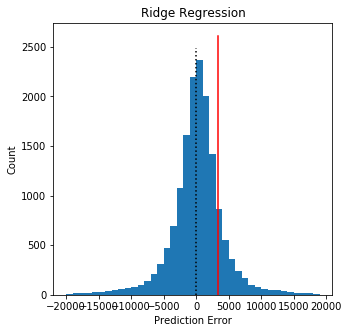

MAE = 3387
R2 = 0.81


In [29]:
ridge_score_train, ridge_score_test, ridge_error_train, ridge_error_test, ridge_mae_train, ridge_mae_test = get_score(clf_ridge, train_dataset, train_labels, test_dataset, test_labels)

ridge_r2_score = r2_score(test_labels, clf_ridge.predict(test_dataset))

fig, ax = plt.subplots(figsize=[5,5])
ax.hist(ridge_error_test, bins=np.arange(-20000,20000,1000))
ax.plot([0,0],[0,ax.get_ylim()[1]], 'k:')
ax.plot([ridge_mae_test, ridge_mae_test],[0,ax.get_ylim()[1]], 'r-')
ax.set_xlabel("Prediction Error")
ax.set_ylabel("Count")
ax.set_title('Ridge Regression')
plt.show()

print("MAE = %d"%(ridge_mae_test))
print("R2 = %0.2f"%(ridge_r2_score))

## Lasso Lars

In [ ]:
clf_lassol = LassoLarsCV(cv=5).fit(train_dataset, train_labels)


In [ ]:
lassol_score_train, lassol_score_test, lassol_error_train, lassol_error_test, lassol_mae_train, lassol_mae_test = get_score(clf_lassol, train_dataset, train_labels, test_dataset, test_labels)

lassol_r2_score = r2_score(test_labels, clf_lassol.predict(test_dataset))

fig, ax = plt.subplots(figsize=[5,5])
ax.hist(lassol_error_test, bins=np.arange(-20000,20000,1000))
ax.plot([0,0],[0,ax.get_ylim()[1]], 'k:')
ax.plot([lassol_mae_test, lassol_mae_test],[0,ax.get_ylim()[1]], 'r-')
ax.set_xlabel("Prediction Error")
ax.set_ylabel("Count")
ax.set_title('Lasso Lars Regression')
plt.show()

print("MAE = %d"%(lassol_mae_test))
print("R2 = %0.2f"%(lassol_r2_score))

## Random Forest

In [30]:
clf_rf = RandomForestRegressor(n_estimators=100).fit(train_dataset, train_labels)

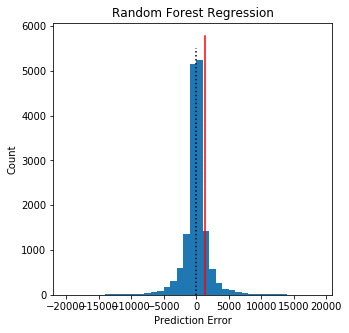

MAE = 1406
R2 = 0.94


In [31]:
rf_score_train, rf_score_test, rf_error_train, rf_error_test, rf_mae_train, rf_mae_test = get_score(clf_rf, train_dataset, train_labels, test_dataset, test_labels)

rf_r2_score = r2_score(test_labels, clf_rf.predict(test_dataset))

fig, ax = plt.subplots(figsize=[5,5])
ax.hist(rf_error_test, bins=np.arange(-20000,20000,1000))
ax.plot([0,0],[0,ax.get_ylim()[1]], 'k:')
ax.plot([rf_mae_test, rf_mae_test],[0,ax.get_ylim()[1]], 'r-')
ax.set_xlabel("Prediction Error")
ax.set_ylabel("Count")
ax.set_title('Random Forest Regression')
plt.show()

print("MAE = %d"%(rf_mae_test))
print("R2 = %0.2f"%(rf_r2_score))

## Test other linear and ensemble models

In [ ]:
def select_model(X, y):

    #create a list of dics which contains models and hyperparameters
    models = [

        {
            "name": "Ada Boost",
            "estimator": AdaBoostRegressor(),
            "hyperparameters":
                {"n_estimators": [50, 100]}
        },
        
    ]
    
    for i, model in enumerate(models):
        print(model["name"])
        print("-"*len(model["name"]))
        
        grid = GridSearchCV(model["estimator"],
                            param_grid=model["hyperparameters"],
                            cv=3,
                            scoring = 'r2',
                            n_jobs=6
                            )

        grid.fit(X,y)
        model["best_params"] = grid.best_params_
        model["best_score"] = grid.best_score_
        model["best_model"] = grid.best_estimator_
        model["scoring"] = grid.scorer_
        
        print("Best Paramerters:\n" + "{}".format(model["best_params"]))
        print("Best Score:\n" + "{}".format(model["best_score"]))
        print("Best Model:\n" + "{}\n".format(model["best_model"]))
        print("Scoring method:\n" + "{}\n".format(model["scoring"]))
        
    return models

In [ ]:
models = select_model(train_dataset, train_labels)

## Fine tune Random Forest Regressor

In [8]:
n_estimators = np.arange(100,1000,10).tolist()
max_features = ['auto', 'sqrt']
max_depth = np.arange(10,100,10).tolist()
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


In [9]:
rf = RandomForestRegressor()

rf_random = RandomizedSearchCV(
    estimator = rf,
    param_distributions = random_grid,
    n_iter = 10,
    cv = 3,
    scoring = 'neg_mean_absolute_error',
    verbose = 2,
    n_jobs = -1,
    )


rf_random.fit(train_dataset, train_labels)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 out of  28 | elapsed: 172.4min remaining:    0.0s


KeyboardInterrupt: 

In [10]:
rf_random.best_params_

AttributeError: 'RandomizedSearchCV' object has no attribute 'best_params_'

In [ ]:
rft_score_train, rft_score_test, rft_error_train, rft_error_test, rft_mae_train, rft_mae_test = get_score(rf_random, train_dataset, train_labels, test_dataset, test_labels)

rft_r2_score = r2_score(test_labels, rf_random.predict(test_dataset))

fig, ax = plt.subplots(figsize=[5,5])
ax.hist(rft_error_test, bins=np.arange(-20000,20000,1000))
ax.plot([0,0],[0,ax.get_ylim()[1]], 'k:')
ax.plot([rft_mae_test, rft_mae_test],[0,ax.get_ylim()[1]], 'r-')
ax.set_xlabel("Prediction Error")
ax.set_ylabel("Count")
ax.set_title('Random Forest Regression (tunned)')
plt.show()

print("MAE = %d"%(rft_mae_test))
print("R2 = %0.2f"%(rft_r2_score))

## Test model with Cross Validation

In [7]:
cols2use = ['advertiser', 'model', 'brand', 'power', 'mileage', 'first_registration_year', 'city', 'fuel', 'cylinder', 'gear_type']
norm = False
trainfrac = 1.0

train_dataset, train_labels, test_dataset, test_labels, train_mean, train_std = prepare_table(df, cols2use=cols2use, norm=norm, trainfrac=trainfrac)

train_dataset_n = (train_dataset-train_mean)/train_std
test_dataset_n = (test_dataset-train_mean)/train_std

In [6]:
rf_final = RandomForestRegressor(
    n_estimators = 200,
    min_samples_split = 2,
    min_samples_leaf = 1,
    max_features = 'auto',
    max_depth = None,
    bootstrap = True,
)

# X, y, _, _, _, _ = prepare_table(df, cols2use=cols2use, norm=False, trainfrac=1.0)

In [12]:
rf_final_cv = cross_validate(
    rf_final, train_dataset, train_labels, 
    cv=5,
    n_jobs=-1,
    verbose=1,
    )



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed: 45.4min remaining: 68.2min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 46.0min finished


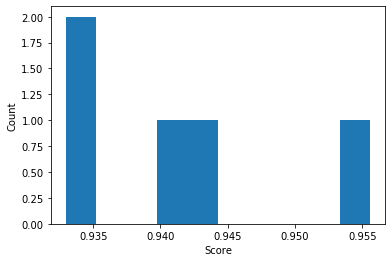

Score = 0.94 +/- 0.01


In [13]:
plt.hist(rf_final_cv['test_score'])
plt.xlabel('Score')
plt.ylabel('Count')
plt.show()

print('Score = %0.2f +/- %0.2f'%(np.mean(rf_final_cv['test_score']),np.std(rf_final_cv['test_score'])))

## Build final RF model

In [16]:
cols2use = ['advertiser', 'model', 'brand', 'power', 'mileage', 'first_registration_year', 'city', 'fuel', 'cylinder', 'gear_type']
norm = False
trainfrac = 0.8

train_dataset, train_labels, test_dataset, test_labels, train_mean, train_std = prepare_table(df, cols2use=cols2use, norm=norm, trainfrac=trainfrac)

rf_final.fit(train_dataset, train_labels)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

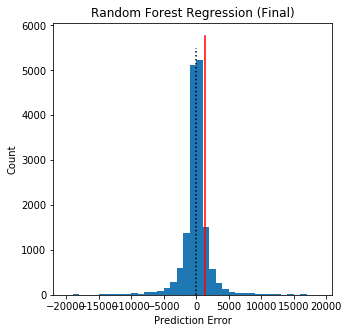

MAE = 1421
R2 = 0.93


In [17]:
rff_score_train, rff_score_test, rff_error_train, rff_error_test, rff_mae_train, rff_mae_test = get_score(rf_final, train_dataset, train_labels, test_dataset, test_labels)

rff_r2_score = r2_score(test_labels, rf_final.predict(test_dataset))

fig, ax = plt.subplots(figsize=[5,5])
ax.hist(rff_error_test, bins=np.arange(-20000,20000,1000))
ax.plot([0,0],[0,ax.get_ylim()[1]], 'k:')
ax.plot([rff_mae_test, rff_mae_test],[0,ax.get_ylim()[1]], 'r-')
ax.set_xlabel("Prediction Error")
ax.set_ylabel("Count")
ax.set_title('Random Forest Regression (Final)')
plt.show()

print("MAE = %d"%(rff_mae_test))
print("R2 = %0.2f"%(rff_r2_score))

## Save Model and variables

In [19]:
model_name = 'rf_cv_model_%s'%(today)

dump(rf_final, '../models/RandomForest/%s.joblib'%(model_name))

train_dataset.to_csv('../models/RandomForest/rf_cv_model_train_dataset_%s.csv'%(today), index=False)
train_labels.to_csv('../models/RandomForest/rf_cv_model_train_labels_%s.csv'%(today), index=False)
test_dataset.to_csv('../models/RandomForest/rf_cv_model_test_dataset_%s.csv'%(today), index=False)
test_labels.to_csv('../models/RandomForest/rf_cv_model_test_labels_%s.csv'%(today), index=False)
train_mean.to_csv('../models/RandomForest/rf_cv_model_train_mean_%s.csv'%(today), index=False)
train_std.to_csv('../models/RandomForest/rf_cv_model_train_std_%s.csv'%(today), index=False)

df_rf_feats = pd.DataFrame(
    {
        'name': model_name,
        'features': [cols2use],
        'train_frac': trainfrac,
        'normalized': norm,
        'mae': rff_mae_test,
        'r2': rff_r2_score,
        }
)

df_rf_feats.to_csv('../models/RandomForest/rf_cv_model_parameters_%s.csv'%(today), index=False)


## Deep Learning model

In [ ]:
def build_dl_model(n_layers=2, activation='relu', units=32, optimizer='RMSprop'):
    model = keras.Sequential()
    model.add(layers.Dense(units, input_shape=[len(train_dataset.keys())], activation=activation))
    for i in range(1,n_layers):
        model.add(layers.Dense(units, activation=activation))
    model.add(layers.Dense(1))    

    model.compile(
        loss='mse',
        optimizer=optimizer,
        metrics=['mae', 'mse'])

    return model

In [ ]:
def build_hp_model(hp):
    model = keras.Sequential()

    # Input layer
    model.add(layers.Dense(
        units=hp.Int('units_0', min_value=32, max_value=128, step=32),
        input_shape=[len(train_dataset.keys())],
        activation='relu'))

    # Deep layers
    for i in range(hp.Int('num_layers', 2, 5)):
        model.add(layers.Dense(
            units=hp.Int('units_' + str(i+1), min_value=32, max_value=128, step=32),
            activation='relu'))

    # Output layer
    model.add(layers.Dense(1, activation='relu'))

    # Compile
    model.compile(
        optimizer=keras.optimizers.RMSprop(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mse',
        metrics=['mae', 'mse'])

    return model

## Keras NN regression

In [ ]:
epochs = 1000
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=30)

model = build_dl_model(n_layers=3, activation='relu', units=128, optimizer='RMSprop')

history = model.fit(
    train_dataset_n,
    train_labels,
    epochs=epochs,
    validation_data=(test_dataset_n, test_labels),
    n_jobs=-1,
    verbose=0,
    callbacks=[early_stop, tfdocs.modeling.EpochDots()]
    )

In [ ]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "mae")

## Hyperparameter tuning

### Hyperband

In [ ]:
max_epochs = 200
executions_per_trial = 1

tuner = Hyperband(
    build_hp_model,
    max_epochs=max_epochs,
    objective='mse',
    executions_per_trial=executions_per_trial,
    directory='neural_net_models/hypertuning/hyperband',
    project_name='standvirtual_%s'%(today)
)

In [ ]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

tuner.search(train_dataset_n, train_labels,
             validation_data=(test_dataset_n, test_labels),
             epochs=max_epochs,
             n_jobs=6,
             verbose=0,
             callbacks=[early_stop])

### Grid search

In [ ]:
epochs = 500
n_layers = [2, 3]
n_neurons = [8, 16]
optimizer = ['RMSprop','Adam']
activation = ['relu','tanh']

param_grid = {
    "optimizer": optimizer,
    "n_layers": n_layers,
    "n_neurons": n_neurons,
    "optimizer": optimizer,
    "activation": activation
}

early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)

model = KerasRegressor(
    build_fn=build_dl_model,
    epochs=epochs,
    validation_split=0.2,
    verbose=0,
    )

grid = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    n_jobs=6,
    cv=2,
    verbose=1,
    )
    
grid_result = grid.fit(train_dataset_n, train_labels, fit_params={'callbacks': [early_stop]})

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']

six = np.argsort(means)[::-1]
for mean, stdev, param in zip(means[six], stds[six], [params[x] for x in six]):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
epochs = 500
n_layers = [2, 3, 4]
n_neurons = [4, 8]
optimizer = ['RMSprop']
activation = ['relu']

param_grid = {
    "optimizer": optimizer,
    "n_layers": n_layers,
    "n_neurons": n_neurons,
    "optimizer": optimizer,
    "activation": activation
}

early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)

model = KerasRegressor(
    build_fn=build_dl_model,
    epochs=epochs,
    validation_split=0.2,
    verbose=0,
    )

grid = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    n_jobs=6,
    cv=2,
    verbose=1,
    )
    
grid_result = grid.fit(train_dataset_n, train_labels, fit_params={'callbacks': [early_stop]})

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']

six = np.argsort(means)[::-1]
for mean, stdev, param in zip(means[six], stds[six], [params[x] for x in six]):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
epochs = 1000
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)

model = build_dl_model(n_layers=2, activation='relu', n_neurons=2, optimizer='RMSprop')

history = model.fit(
    train_dataset_n,
    train_labels,
    epochs=epochs,
    validation_split = 0.2,
    verbose=0,
    callbacks=[early_stop, tfdocs.modeling.EpochDots()]
    )

In [ ]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "mae")

In [ ]:
loss, mae, mse = model.evaluate(test_dataset, test_labels, verbose=2)

In [ ]:
test_predictions = model.predict(test_dataset).flatten()

fig, ax = plt.subplots(1,2,figsize=[15,5])
ax[0].plot(test_labels, test_predictions, 'o')
ax[0].axis('equal')
ax[0].set_xlabel('True Values')
ax[0].set_ylabel('Predictions')

error = test_predictions - test_labels
ax[1].hist(error, bins=np.arange(-20000,20000,1000))
ax[1].plot([0,0],[0,ax[1].get_ylim()[1]], 'k:')
ax[1].set_xlabel("Prediction Error")
ax[1].set_ylabel("Count")
plt.show()

In [ ]:
np.mean(abs(error))

## T-SNE

In [ ]:
tsne_perp = 50
tsne_dim = 2

X_tsne = TSNE(n_components=tsne_dim, n_jobs=-1, perplexity=tsne_perp).fit_transform(X)


In [ ]:
fig, ax = plt.subplots()
plt.scatter(X_tsne[:,0],X_tsne[:,1])
plt.axis('equal')
plt.show()

## Difference beteen actual and predicted price

In [ ]:
md = Y-clf_rdg.predict(X)
md_r = md/Y
plt.hist(md_r, bins=np.arange(-2,2.1,0.1), density=True)
plt.show()

## How does price difference change with price percentiles?

In [ ]:
percs_x = np.arange(5,100,5)
percs_y = np.percentile(Y,percs_x)

percs_ix = [np.where(x >= percs_y)[0][-1] if x > percs_y[0] else 0 for x in Y]

dfP = pd.DataFrame(np.array([Y,md,md_r,percs_ix]).T, columns=['price','md','md_r','perc'])
dfP = dfP[(dfP['md_r'] >= -1) & (dfP['md_r'] <= 1)]
dfX2 = pd.concat([dfX,dfP], axis=1)

fig, ax = plt.subplots(figsize=[20,10])
sns.violinplot(x='perc', y='md_r', data=dfX2, ax=ax)
ax.set_xticklabels(np.round(percs_y))
l, r = ax.get_xlim()
plt.plot([l,r],[0,0],'k:')
plt.plot(dfX2.groupby('perc').median()['md_r'].values, 'r', linewidth=2)
plt.show()

In [ ]:
price_lims = [0, 60000]
bin_w = 1000

def modify_doc(doc):
    def make_dataset(df, col2use, labs2use=[]):
        
        df0 = pd.DataFrame(columns=['proportion', 'left', 'right', 'f_proportion', 'f_interval', 'name', 'color'])
        
        if not any(labs2use):
            values = df[col2use].unique()
        else:
            values = list(labs2use)
        colors = d3['Category20'][20]+d3['Category20b'][20]+d3['Category20c'][20]
        if len(values) > 60:
            colors = colors*int(np.ceil(len(values)/60))
        

        # Iterate through all the carriers
        for i, val in enumerate(values):

            # Subset to the carrier
            subset = df[df[col2use] == val]

            # Create a histogram with specified bins and range
            arr_hist, edges = np.histogram(subset['price'], bins=int(price_lims[1]/bin_w), range=price_lims)

            # Divide the counts by the total to get a proportion and create df
            arr_df = pd.DataFrame({'proportion': arr_hist / np.sum(arr_hist), 
                                'left': edges[:-1], 'right': edges[1:] })

            # Format the proportion 
            arr_df['f_proportion'] = ['%0.5f' % proportion for proportion in arr_df['proportion']]

            # Format the interval
            arr_df['f_interval'] = ['%d to %d euros' % (left, right) for left, 
                                    right in zip(arr_df['left'], arr_df['right'])]

            # Assign the name
            arr_df['name'] = val

            # Color each value
            
            arr_df['color'] = colors[i]

            # Add to the overall dataframe
            df0 = df0.append(arr_df, ignore_index=True)

        # Overall dataframe
        df0 = df0.sort_values(['name', 'left']).reset_index(drop=True)
        
        # Convert dataframe to column data source
        return ColumnDataSource(df0)


    def make_plot(src):
        # Blank plot with correct labels
        p = figure(plot_width = 700, plot_height = 700, 
                    title = 'Car price histogram',
                    x_axis_label = 'Price', y_axis_label = 'Proportion')

        # Quad glyphs to create a histogram
        p.quad(source = src, bottom = 0, top = 'proportion', left = 'left', right = 'right',
                color = 'color', fill_alpha = 0.5, hover_fill_color = 'color', legend_field = 'name',
                hover_fill_alpha = 1.0, line_color = 'black')

        # Hover tool with vline mode
        hover = HoverTool(tooltips=[('Value', '@name'), 
                                    ('Range', '@f_interval'),
                                    ('Proportion', '@f_proportion')],
                                    mode='vline')

        p.add_tools(hover)
        p.hover.point_policy = "follow_mouse"

        return p


        def update(attr, old, new):
            labs2use = [selection.labels[i] for i in selection.active]
            
            new_src = make_dataset(df, col2use, labs2use)

            src.data.update(new_src.data)

        labs = df[col2use].unique()
        selection = CheckboxGroup(labels=labs, active = [0, 1])            
        selection.on_change('active', update)
        
        controls = WidgetBox(selection)
        
        initial_labs = [selection.labels[i] for i in selection.active]
        
        src = make_dataset(df, col2use, initial_labs)
        
        p = make_plot(src)
        
        layout = row(controls, p)
        doc.add_root(layout)
        
# Set up an application
handler = FunctionHandler(modify_doc)
app = Application(handler)

In [ ]:
show(app)